# MOM6 ANALYSIS - 2D surface variables
## CONTENTS;
### 1. Kinetic Energy Mean-Transient Decomposition;
### 2. Compare SSH model output and observations;
### 3. Sea Surface Temperature comparison with NOAA OISST

In [1]:
import matplotlib.pyplot as plt
import cmocean as cm
import xarray as xr
import numpy as np
import glob
import xesmf

from dask.distributed import Client

import warnings
warnings.filterwarnings('ignore')

In [2]:
# import cartopy to plot maps
import cartopy.crs as ccrs
import cartopy.feature as feature
land_50m = feature.NaturalEarthFeature('physical', 'land', '50m', 
                                       edgecolor='black',
                                       facecolor='gray',
                                       linewidth=0.2)

In [3]:
help(Client)

Help on class Client in module distributed.client:

class Client(distributed.utils.SyncMethodMixin)
 |  Client(address=None, loop=None, timeout='__no_default__', set_as_default=True, scheduler_file=None, security=None, asynchronous=False, name=None, heartbeat_interval=None, serializers=None, deserializers=None, extensions={'pubsub': <class 'distributed.pubsub.PubSubClientExtension'>}, direct_to_workers=None, connection_limit=512, **kwargs)
 |  
 |  Connect to and submit computation to a Dask cluster
 |  
 |  The Client connects users to a Dask cluster.  It provides an asynchronous
 |  user interface around functions and futures.  This class resembles
 |  executors in ``concurrent.futures`` but also allows ``Future`` objects
 |  within ``submit/map`` calls.  When a Client is instantiated it takes over
 |  all ``dask.compute`` and ``dask.persist`` calls by default.
 |  
 |  It is also common to create a Client without specifying the scheduler
 |  address , like ``Client()``.  In this cas

In [3]:
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/38729/status,
Dashboard: /proxy/38729/status,Workers: 7
Total threads: 14,Total memory: 63.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:44119,Workers: 7
Dashboard: /proxy/38729/status,Total threads: 14
Started: Just now,Total memory: 63.00 GiB
Comm: tcp://127.0.0.1:43489,Total threads: 2
Dashboard: /proxy/33209/status,Memory: 9.00 GiB
Nanny: tcp://127.0.0.1:33145,


In [4]:
# set paths to model output
## SRM
# eac_003 = '/scratch/v45/jr5971/mom6/archive/eac-003-latest/'
eac_003 = '/scratch/v45/jr5971/mom6-setonix/eac_iaf_003/'
## LRM
# sthpac_01 = '/scratch/v45/jr5971/mom6/archive/southpac-01/'
sthpac_01 = '/scratch/v45/jr5971/mom6-setonix/sthpac_iaf_01/'
## PARENT
access = '/g/data/ik11/outputs/access-om2-01/01deg_jra55v150_iaf_cycle1/'

Right, so we've got our paths to the model output. Now we want to start by getting `surface speed` from each of the models. Does the ACCESS model have this?
* Looks like the best variable in ACCESS is the directional velocities;

In [5]:
def open_iaf_global(iaf_source = "/g/data/ik11/outputs/access-om2-01/01deg_jra55v150_iaf_cycle1", 
                    first_year = 1990,
                    last_year = 1995,
                    input_vars=['u','v','salt','temp','eta_t'],
                    frequency = "daily",
                    decode_times=False):

    year_range = range(first_year, last_year+1)
    filepaths = []
    for year in year_range:
        for var in input_vars:
            pattern = f'{iaf_source}/output*/ocean/ocean-*d-{var}*-1-{frequency}-mean-ym_{year}_*.nc'
            matches = glob.glob(pattern)
            filepaths.extend(matches)
    om2_iaf = xr.open_mfdataset(filepaths, decode_times=decode_times, parallel=True, 
                                chunks={'time':-1, 'yu_ocean':300, 'yt_ocean':300, 'xu_ocean':300, 'xt_ocean':300})
    return om2_iaf, filepaths

## 1. KINETIC ENERGY MEAN-TRANSIENT DECOMPOSITION;
This is the first of several notebooks I'll be using to analyse the output of the mom6 regional experiments, also in comparison to the ACCESS-OM2-01 parent model that we use to force the nested models.

I'm starting with KE decomposition as this is of particular interest when moving to higher resolutions. Also, with MOM6 saving the `speed` variable at the surface, we should be able to perform the decomposition quite easily. 

In [6]:
# get vars from access;
om2_iaf, _ = open_iaf_global(input_vars=['u','v'],
                            decode_times=True)
om2_iaf

<xarray.Dataset>
Dimensions:         (xu_ocean: 3600, yu_ocean: 2700, st_ocean: 75,
                     st_edges_ocean: 76, time: 2191, nv: 2)
Coordinates:
  * xu_ocean        (xu_ocean) float64 -279.9 -279.8 -279.7 ... 79.8 79.9 80.0
  * yu_ocean        (yu_ocean) float64 -81.09 -81.05 -81.0 ... 89.92 89.96 90.0
  * st_ocean        (st_ocean) float64 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * st_edges_ocean  (st_edges_ocean) float64 0.0 1.083 ... 5.61e+03 5.809e+03
  * time            (time) datetime64[ns] 1990-01-01T12:00:00 ... 1995-12-31T...
  * nv              (nv) float64 1.0 2.0
Data variables:
    u               (time, st_ocean, yu_ocean, xu_ocean) float32 dask.array<chunksize=(31, 75, 300, 300), meta=np.ndarray>
    average_T1      (time) datetime64[ns] dask.array<chunksize=(31,), meta=np.ndarray>
    average_T2      (time) datetime64[ns] dask.array<chunksize=(31,), meta=np.ndarray>
    average_DT      (time) timedelta64[ns] dask.array<chunksize=(31,), meta=np.ndarray>
    time_bnds       (time, nv) timedelta64[ns] dask.array<chunksize=(31, 2), meta=np.ndarray>
    v               (time, st_ocean, yu_ocean, xu_ocean) float32 dask.array<chunksize=(31, 75, 300, 300), meta=np.ndarray>
Attributes:
    filename:   ocean-3d-u-1-daily-mean-ym_1990_01.nc
    title:      ACCESS-OM2-01
    grid_type:  mosaic
    grid_tile:  1
    history:    20221019T1337Z: /g/data/ik11/inputs/access-om2/bin/mppnccombi...

In [ ]:
# import speed data from regional models;
eac_files = glob.glob(eac_003+'output*/*daily.nc')
eac_daily = xr.open_mfdataset(eac_files)
sthpac_files = glob.glob(sthpac_01+ 'output*/*daily.nc')
sthpac_daily = xr.open_mfdataset(sthpac_files)
print(f'date range for eac; {eac_daily.time.min().values} - {eac_daily.time.max().values}')

date range for eac; 1990-11-01 12:00:00 - 1993-02-28 12:00:00


In [ ]:
print(f'date range for sthpac; {sthpac_daily.time.min().values} - {sthpac_daily.time.max().values}')

date range for sthpac; 1990-01-01 12:00:00 - 1994-12-31 12:00:00


Right, so we've loaded in all the data. We can see that the smallest date range is from 1990 to the end of 1994 (5 years in total). Let's set this as our date range.

Next we need to subset spatial extent down to the smallest spatial extent which is the LRM (SOUTHPAC-01) in this case. Let's get the coordinate limits of this and subset the PARENT and LRM models.

In [9]:
date_range = [str(sthpac_daily.time.min().values), str(sthpac_daily.time.max().values)]
# subset PARENT AND EAC in time;
access_daily = om2_iaf.sel(time=slice(date_range[0], date_range[1]))
eac_daily = eac_daily.sel(time=slice(date_range[0], date_range[1]))

Before subsetting spatially, I want to make a nice overview plot showing the nested model inside the regional model...
Let's just plot a snapshot of speed say sometime near the end of the run...

In [17]:
from matplotlib import patches

To make things easier for plotting, let's shift everything 360 degrees...

In [24]:
for ds in [access_daily, sthpac_daily, eac_daily]:
    try:
        ds['xh'] = ds.xh + 360
    except:
        ds['xu_ocean'] = ds.xu_ocean + 360

In [47]:
import cartopy.feature as cfeature

In [48]:
land_feature = cfeature.NaturalEarthFeature(
    'physical', 'land', '110m', edgecolor='face', facecolor=cfeature.COLORS['land']
)

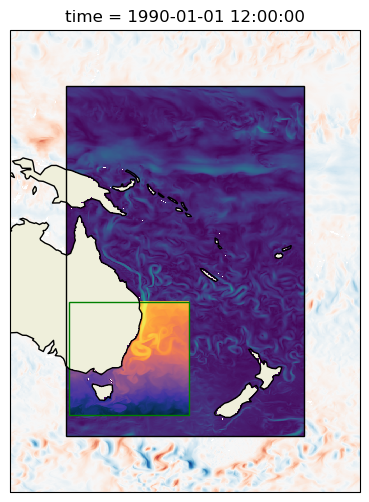

In [50]:
# subset global to some region just bigger than the sthpac model...
# sthpac_idx = {'W':sthpac_daily.xh.min().values, 'E':sthpac_daily.xh.max().values, 
#               'S':sthpac_daily.yh.min().values, 'N':sthpac_daily.yh.max().values}
# eac_idx = {'W':eac_daily.xh.min().values, 'E':eac_daily.xh.max().values,
#            'S':eac_daily.yh.min().values, 'N':eac_daily.yh.max().values}
# access_daily_subsetted = access_daily.sel(xu_ocean=slice(sthpac_idx['W'] - 10, sthpac_idx['E']+10),
#                                           yu_ocean = slice(sthpac_idx['S']-10, sthpac_idx['N']+10))
fig = plt.figure(figsize=(10,6))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=-180))
access_daily_subsetted['v'].isel(time=0, st_ocean=0).plot(ax=ax, add_colorbar=False, transform=ccrs.PlateCarree())
sthpac_daily['speed'].isel(time=0).plot(ax=ax,add_colorbar=False, transform = ccrs.PlateCarree())
eac_daily['tos'].isel(time=0).plot(ax=ax, cmap=cm.cm.thermal, add_colorbar=False,transform=ccrs.PlateCarree())
box1 = patches.Rectangle((sthpac_idx['W'], sthpac_idx['S']), (sthpac_idx['E']-sthpac_idx['W']), 
                        (sthpac_idx['N']-sthpac_idx['S']), fill=None, transform=ccrs.PlateCarree())
box2 = patches.Rectangle((eac_idx['W'], eac_idx['S']), (eac_idx['E']-eac_idx['W']), 
                        (eac_idx['N']-eac_idx['S']), color='g', fill=None, transform=ccrs.PlateCarree())
ax.add_patch(box1); ax.add_patch(box2)
ax.add_feature(land_feature, zorder=0)
ax.coastlines()

Right so this is pretty cool and it'd be awesome to animate this...

In [51]:
from matplotlib.animation import FuncAnimation

In [72]:
len(sthpac_daily.time)

1826

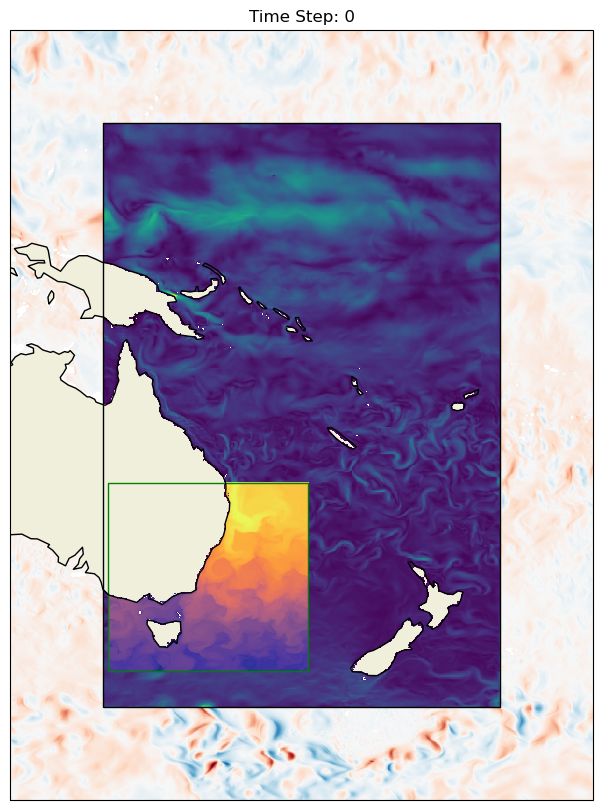

In [75]:
import matplotlib.animation as animation

start = 1700

fig = plt.figure(figsize=(10,10))
ax = plt.axes(projection = ccrs.PlateCarree(central_longitude=-180))
# Plot initial frame
access_daily_subsetted['v'].isel(time=start, st_ocean=0).plot(ax=ax, add_colorbar=False, transform=ccrs.PlateCarree())
sthpac_daily['speed'].isel(time=start).plot(ax=ax, add_colorbar=False, transform=ccrs.PlateCarree())
eac_daily['tos'].isel(time=start).plot(ax=ax, cmap=cm.cm.thermal, add_colorbar=False, transform=ccrs.PlateCarree())

 # Add rectangles
box1 = patches.Rectangle((sthpac_idx['W'], sthpac_idx['S']), (sthpac_idx['E']-sthpac_idx['W']), 
                        (sthpac_idx['N']-sthpac_idx['S']), fill=None, transform=ccrs.PlateCarree())
box2 = patches.Rectangle((eac_idx['W'], eac_idx['S']), (eac_idx['E']-eac_idx['W']), 
                        (eac_idx['N']-eac_idx['S']), color='g', fill=None, transform=ccrs.PlateCarree())
ax.add_patch(box1)
ax.add_patch(box2)

# Add land feature and coastlines
ax.add_feature(land_feature, zorder=0)
ax.coastlines()

# Set title
# ax.set_title(f'Time Step: {day}')
def animate(frame):
    ax.clear()
    
    # Plot your data for each frame
    access_daily_subsetted['v'].isel(time=start+frame, st_ocean=0).plot(ax=ax, add_colorbar=False, transform=ccrs.PlateCarree())
    sthpac_daily['speed'].isel(time=start+frame).plot(ax=ax, add_colorbar=False, transform=ccrs.PlateCarree())
    eac_daily['tos'].isel(time=start+frame).plot(ax=ax, cmap=cm.cm.thermal, add_colorbar=False, transform=ccrs.PlateCarree())
    
     # Add rectangles
    box1 = patches.Rectangle((sthpac_idx['W'], sthpac_idx['S']), (sthpac_idx['E']-sthpac_idx['W']), 
                            (sthpac_idx['N']-sthpac_idx['S']), fill=None, transform=ccrs.PlateCarree())
    box2 = patches.Rectangle((eac_idx['W'], eac_idx['S']), (eac_idx['E']-eac_idx['W']), 
                            (eac_idx['N']-eac_idx['S']), color='g', fill=None, transform=ccrs.PlateCarree())
    ax.add_patch(box1)
    ax.add_patch(box2)
    
    # Add land feature and coastlines
    ax.add_feature(land_feature, zorder=0)
    ax.coastlines()
    
    # Set title
    ax.set_title(f'Time Step: {frame}')
    
ani = animation.FuncAnimation(
    fig, 
    animate, 
    frames = 20,
    interval = 200
)


In [76]:
HTML(ani.to_jshtml())

In [ ]:
ani.save('nesting.gif')

In [65]:
writer = animation.PillowWriter(fps=3)

In [66]:
writer

In [59]:
from IPython.display import HTML

In [ ]:
animation.save('nested_models.gif', writer='pillow')

In [10]:
access_daily

<xarray.Dataset>
Dimensions:         (xu_ocean: 3600, yu_ocean: 2700, st_ocean: 75,
                     st_edges_ocean: 76, time: 1826, nv: 2)
Coordinates:
  * xu_ocean        (xu_ocean) float64 -279.9 -279.8 -279.7 ... 79.8 79.9 80.0
  * yu_ocean        (yu_ocean) float64 -81.09 -81.05 -81.0 ... 89.92 89.96 90.0
  * st_ocean        (st_ocean) float64 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * st_edges_ocean  (st_edges_ocean) float64 0.0 1.083 ... 5.61e+03 5.809e+03
  * time            (time) datetime64[ns] 1990-01-01T12:00:00 ... 1994-12-31T...
  * nv              (nv) float64 1.0 2.0
Data variables:
    u               (time, st_ocean, yu_ocean, xu_ocean) float32 dask.array<chunksize=(31, 75, 300, 300), meta=np.ndarray>
    average_T1      (time) datetime64[ns] dask.array<chunksize=(31,), meta=np.ndarray>
    average_T2      (time) datetime64[ns] dask.array<chunksize=(31,), meta=np.ndarray>
    average_DT      (time) timedelta64[ns] dask.array<chunksize=(31,), meta=np.ndarray>
    time_bnds       (time, nv) timedelta64[ns] dask.array<chunksize=(31, 2), meta=np.ndarray>
    v               (time, st_ocean, yu_ocean, xu_ocean) float32 dask.array<chunksize=(31, 75, 300, 300), meta=np.ndarray>
Attributes:
    filename:   ocean-3d-u-1-daily-mean-ym_1990_01.nc
    title:      ACCESS-OM2-01
    grid_type:  mosaic
    grid_tile:  1
    history:    20221019T1337Z: /g/data/ik11/inputs/access-om2/bin/mppnccombi...

In [ ]:
day = '1992-12-07'
access_snap

In [44]:
# spatial extent;
yextent = [eac_daily.yh.min().values, eac_daily.yh.max().values]
xextent = [eac_daily.xh.min().values, eac_daily.xh.max().values]
# subset PARENT AND LRM
access_daily = access_daily.sel(xu_ocean = slice(xextent[0], xextent[1]), 
                           yu_ocean = slice(yextent[0], yextent[1])).isel(st_ocean=0, st_edges_ocean=0)
sthpac_daily = sthpac_daily.sel(xh=slice(xextent[0], xextent[1]),
                                yh=slice(yextent[0], yextent[1]))
print(f'sthpac new dims are: {sthpac_daily.dims}')
print(f'access new dims are: {access_daily.dims}')

sthpac new dims are: Frozen({'xh': 215, 'yh': 253, 'time': 1826, 'nv': 2})
access new dims are: Frozen({'xu_ocean': 214, 'yu_ocean': 252, 'time': 1826, 'nv': 2})


Okay so now we have all data cut down to the same region (roughly - as ACCESS is on B-grid, it has one extra gridcell compared to the mom6 model grids).

Let's get the speed variable from ACCESS first;

In [53]:
%%time
access_speed = np.sqrt(access_daily['u']**2 + access_daily['v']**2)
sthpac_speed = sthpac_daily['speed']
eac_speed = eac_daily['speed']
# Print dims;
print(f'access dims: {access_speed.shape}; \n sthpac dims: {sthpac_speed.shape}; \n eac dims: {eac_speed.shape}')

access dims: (1826, 252, 214); 
 sthpac dims: (1826, 253, 215); 
 eac dims: (1826, 759, 645)
CPU times: user 18.9 ms, sys: 4.48 ms, total: 23.4 ms
Wall time: 22.4 ms


Now a quick summary of the theory for decomposing KE;
### Decomposing the kinetic energy into time-mean and transient components;
#### Theory:
For a hydrostatic ocean model like MOM6, the relevant KE per unit mass is:
$$
KE = \frac{1}{2} (u^2 + v^2)
$$
i.e., proportional to the squared speed...

The vertical velocity component, $w$ does not appear in the mechanical energy budget. It is very much subdominant. But more fundamentally, it simply does not appear in the mechanical budget for a hydrostatic ocean.

For a non-steady fluid, we can define the time-averaged KE as the **Total KE**:
$$
TKE = <KE> = \frac{1}{T} \int^T_0 \frac{1}{2}(u^2+v^2)dt
$$

It is useful to decompose the velocity into time-mean and time-varying components, e.g., 
$$
u = \bar{u} + u'
$$
The **mean kinetic energy** is the energy associated with the mean flow;
$$ 
MKE = \frac{1}{2}(\bar{u}^2 + \bar{v}^2)
$$
The kinetic energy of the time-varying component is the **eddy kinetic energy**, EKE. This quantity can be obtained by subtracting the velocity means, and calculating the KE of the perturbation velocity quantities:
$$
EKE = \bar{\frac{1}{2}[(u-\bar{u})^2+(v-\bar{v})^2]}
$$
MKE and EKE partition the total kinetic energy.
$$
TKE = MKE + EKE
$$

In [54]:
%%time
# mean speeds...
access_speed_mean = access_speed.mean('time').compute()
sthpac_speed_mean = sthpac_speed.mean('time').compute()
eac_speed_mean = eac_speed.mean('time').compute()

CPU times: user 16.6 s, sys: 2.42 s, total: 19.1 s
Wall time: 2min 36s


In [55]:
%%time
# transients / residual...
access_speed_eddy = access_speed - access_speed_mean
sthpac_speed_eddy = sthpac_speed - sthpac_speed_mean
eac_speed_eddy = eac_speed - eac_speed_mean

CPU times: user 25.1 ms, sys: 824 µs, total: 25.9 ms
Wall time: 26.3 ms


In [56]:
%%time
# EDDY KINETIC ENERGY
EKE_access = (0.5*(access_speed_eddy**2)).compute()
EKE_sthpac = (0.5*(sthpac_speed_eddy**2)).compute()
EKE_eac = (0.5*(eac_speed_eddy**2)).compute()

CPU times: user 12.4 s, sys: 7.96 s, total: 20.3 s
Wall time: 1min 3s


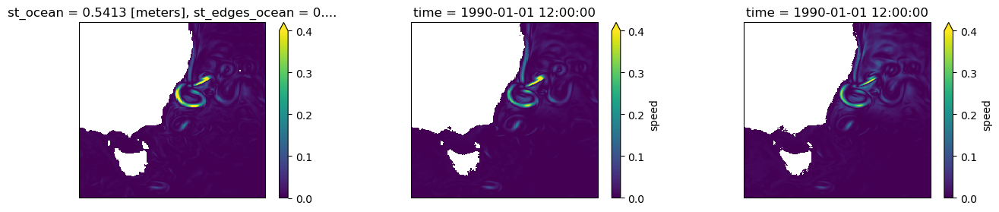

In [65]:
# PLOT SNAPSHOT
fig, axs = plt.subplots(ncols=3, figsize=(16,3), subplot_kw = {'projection':ccrs.PlateCarree()})
EKE_access[0,:].plot(ax=axs[0], vmax=0.4)
EKE_sthpac[0,:].plot(ax=axs[1], vmax=0.4)
EKE_eac[0,:].plot(ax=axs[2], vmax=0.4)

In [67]:
%%time 
# Calculate Mean over time for each model
EKE_access_mean = EKE_access.mean('time')
EKE_sthpac_mean = EKE_sthpac.mean('time')
EKE_eac_mean = EKE_eac.mean('time')

CPU times: user 3.72 s, sys: 1.44 s, total: 5.16 s
Wall time: 4.64 s


Text(0.5, 1.0, 'EAC-003')

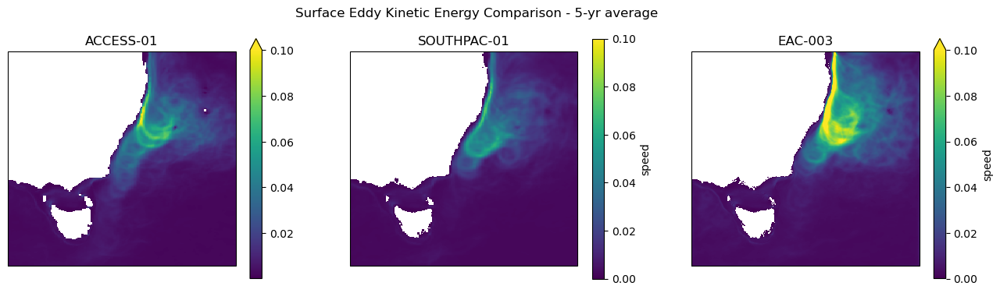

In [76]:
# PLOT AVERAGE OVER TIME
fig, axs = plt.subplots(ncols=3, figsize=(16,4), subplot_kw = {'projection':ccrs.PlateCarree()})
EKE_access_mean.plot(ax=axs[0], vmax=0.1)
EKE_sthpac_mean.plot(ax=axs[1], vmax=0.1)
EKE_eac_mean.plot(ax=axs[2], vmax=0.1)
fig.suptitle('Surface Eddy Kinetic Energy Comparison - 5-yr average')
axs[0].set_title("ACCESS-01")
axs[1].set_title("SOUTHPAC-01")
axs[2].set_title("EAC-003")

I have to bear in mind that these figures are just placeholders and might not show the full story. I'm hoping that when I run the model again, I won't have the spuriously high amplification of poleward velocities at the northern boundary of the EAC jet.

## 2. Compare SSH model output and observations;
Specifically we plot the time-mean and standard deviation of SSH and compare it to those obtained from observations from CMEMS satellite altimetry (former AVISO + dataset). 

In [7]:
om2_ssh,_ = open_iaf_global(input_vars=['eta_t'],
                           decode_times=True)

In [9]:
# import daily data from regional models;
eac_files = glob.glob(eac_003+'output*/*daily.nc')
eac_daily = xr.open_mfdataset(eac_files)
sthpac_files = glob.glob(sthpac_01+ 'output*/*daily.nc')
sthpac_daily = xr.open_mfdataset(sthpac_files)
print(f'date range for eac; {eac_daily.time.min().values} - {eac_daily.time.max().values}')

date range for eac; 1990-02-02 12:00:00 - 2000-10-31 12:00:00


In [10]:
print(f'date range for sthpac; {sthpac_daily.time.min().values} - {sthpac_daily.time.max().values}')

date range for sthpac; 1990-02-01 12:00:00 - 2012-01-31 12:00:00


**Select the minimum date range from the above two outputs**

In [11]:
min_daterange = eac_daily
date_range = [str(min_daterange.time.min().values), str(min_daterange.time.max().values)]
# subset PARENT AND STHPAC in time;
access_daily = om2_ssh.sel(time=slice(date_range[0], date_range[1]))
sthpac_daily = sthpac_daily.sel(time=slice(date_range[0], date_range[1]))['zos']
eac_daily = eac_daily['zos']

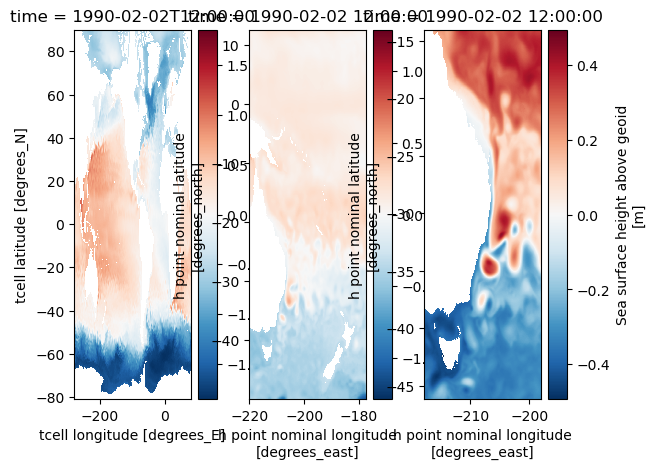

In [13]:
plt.subplot(1,3,1)
access_daily['eta_t'].isel(time=0).plot()
plt.subplot(1,3,2)
sthpac_daily.isel(time=0).plot()
plt.subplot(1,3,3)
eac_daily['zos'].isel(time=0).plot()

**Subset down to the EAC Domain**

In [12]:
# spatial extent;
yextent = [eac_daily.yh.min().values, eac_daily.yh.max().values]
xextent = [eac_daily.xh.min().values, eac_daily.xh.max().values]
# subset PARENT AND LRM
access_daily = access_daily.sel(xt_ocean = slice(xextent[0], xextent[1]), 
                           yt_ocean = slice(yextent[0], yextent[1]))['eta_t']
sthpac_daily = sthpac_daily.sel(xh=slice(xextent[0], xextent[1]),
                                yh=slice(yextent[0], yextent[1]))
print(f'sthpac new dims are: {sthpac_daily.dims}')
print(f'access new dims are: {access_daily.dims}')

sthpac new dims are: ('time', 'yh', 'xh')
access new dims are: ('time', 'yt_ocean', 'xt_ocean')


### Load CMEMS satellite observational data;
Load the CMEMS dataset and select `adt` the sea surface height variable name.

In [13]:
filenames = glob.glob("/g/data/ua8/CMEMS_SeaLevel/timeseries/*.nc")
cmems = xr.open_mfdataset(filenames, parallel=True)

obs_ssh = cmems.adt
obs_ssh = obs_ssh.sel(latitude=slice(yextent[0], yextent[1]),
                      longitude=slice(xextent[0]+360, xextent[1]+360))
obs_ssh = obs_ssh.rename('adt_cmems')
obs_ssh

<xarray.DataArray 'adt_cmems' (time: 10016, latitude: 129, longitude: 79)>
dask.array<getitem, shape=(10016, 129, 79), dtype=float64, chunksize=(366, 129, 79), chunktype=numpy.ndarray>
Coordinates:
  * time       (time) datetime64[ns] 1993-01-01 1993-01-02 ... 2020-06-03
  * longitude  (longitude) float32 142.4 142.6 142.9 143.1 ... 161.4 161.6 161.9
  * latitude   (latitude) float32 -46.12 -45.88 -45.62 ... -14.62 -14.38 -14.12
Attributes:
    standard_name:  sea_surface_height_above_geoid
    long_name:      Absolute dynamic topography
    units:          m
    grid_mapping:   crs
    comment:        The absolute dynamic topography is the sea surface height...

In [15]:
print(f'date range for obs_ssh; {obs_ssh.time.min().values} - {obs_ssh.time.max().values}')

date range for obs_ssh; 1993-01-01T00:00:00.000000000 - 2020-06-03T00:00:00.000000000


### Pre-processing
So based on the discussions with ChrisC, in order to make a robust comparison between the high-resolution model output and the altimetry observations, we need to do a bit of preprocessing. The key reason for this based on how the altimetry dataset was created - Spatially, the swaths that provide the data are relatively sparse, whilst the resolution achieved by the gridded product is through a weighted interpolation of the data in the swath tracks. For this reason, the variance captured by the altimetry is actually in itself, an underestimate of the true surface height variability. Hence, to account for this, we re-grid the high-resolution output to the coarser altimetry grid before calculating variance characteristics. Chris mentioned this is somewhat to ensure that the variance we calculate is true and not a spurious result of the high resolution model. Temporally, due to the intermittent swaths, satellite data is more like weekly snapshots rather than daily output. This means that we should really look at resampling the daily MOM6 data to a weekly metric (either mean, median, snapshot etc.). 

In [18]:
# input grid - eac-003
## rename coords for regridding
eac_raw = eac_daily.rename({'yh':'lat','xh':'lon'})
sthpac_raw = sthpac_daily.rename({'yh':'lat','xh':'lon'})
access_raw = access_daily.rename({'yt_ocean':'lat','xt_ocean':'lon'})
## chunk access to avoid errors
access_raw = access_raw.chunk({'time':500, 'lat':-1,'lon':-1})

# output grid - obs_ssh
obs_raw = obs_ssh.rename({'latitude':'lat','longitude':'lon'})
## Change the time-format for the MOM6 data
datetimeindex_eac = eac_daily.indexes['time'].to_datetimeindex()
eac_raw['time'] = ('time',datetimeindex_eac)
datetimeindex_sthpac = sthpac_daily.indexes['time'].to_datetimeindex()
sthpac_raw['time'] = ('time',datetimeindex_sthpac)
# datetimeindex_om2 = access_daily.indexes['time'].to_datetimeindex()
# access_raw['time'] = ('time',datetimeindex_om2)

# regrid eac and sthpac to obs
regridder_eac = xesmf.Regridder(eac_raw, obs_raw, method='bilinear')
regridder_sthpac = xesmf.Regridder(sthpac_raw, obs_raw, method='bilinear')
regridder_access = xesmf.Regridder(access_raw, obs_raw, method='bilinear')

# regrid datasets;
eac_regridded = regridder_eac(eac_raw)
sthpac_regridded = regridder_sthpac(sthpac_raw)
access_regridded = regridder_access(access_raw)

In [19]:
## Resampling to 5-day averages...
eac_regridded_resampled = eac_regridded.resample(time='5D').mean()
sthpac_regridded_resampled = sthpac_regridded.resample(time='5D').mean()
access_regridded_resampled = access_regridded.resample(time='5D').mean()

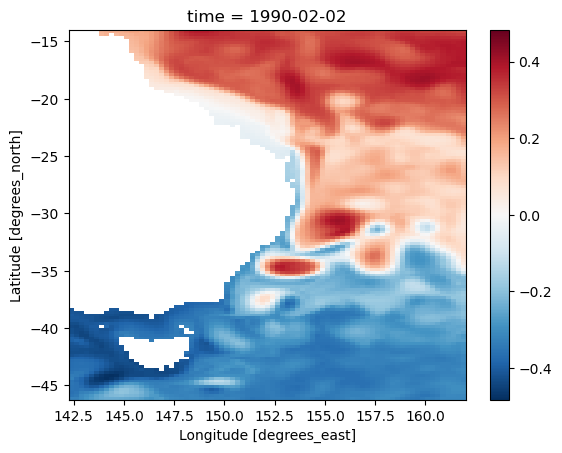

In [20]:
eac_regridded_resampled.isel(time=0).plot()

Text(0.5, 0.98, 'Comparison after regridding and resampling')

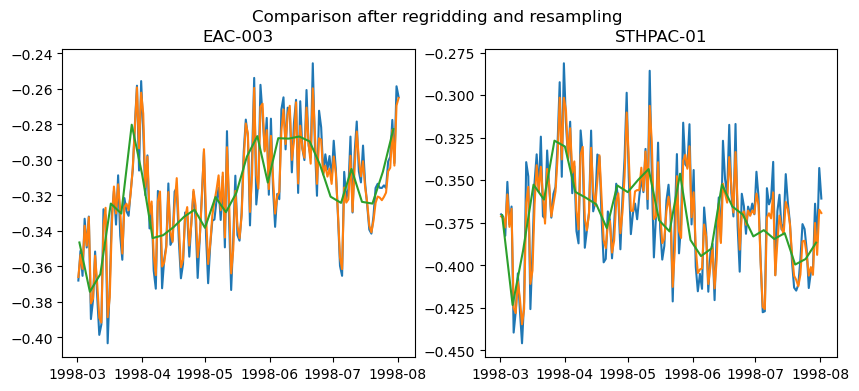

In [23]:
start = '1998-03-01'
end = '1998-08-01'
coord = [148, -43]
eac_ls = [eac_daily, eac_regridded, eac_regridded_resampled]
sthpac_ls = [sthpac_daily, sthpac_regridded, sthpac_regridded_resampled]


fig, ax = plt.subplots(ncols=2, figsize=(10,4))

for i in range(3):
    try:
        ds1 = eac_ls[i].sel(time=slice(start,end)).sel(lat=coord[1],lon=coord[0],method='nearest')
        dates1 = ds1['time']
        ds2 = sthpac_ls[i].sel(time=slice(start,end)).sel(lat=coord[1], lon=coord[0], method='nearest')
        dates2 = ds2['time']

    except:
        ds1 = eac_ls[i].sel(time=slice(start,end)).sel(yh=coord[1],xh=coord[0]-360,method='nearest')
        dates1 = ds1.indexes['time'].to_datetimeindex()
        ds2 = sthpac_ls[i].sel(time=slice(start,end)).sel(yh=coord[1],xh=coord[0]-360,method='nearest')
        dates2 = ds2.indexes['time'].to_datetimeindex()
        
    ax[0].plot(dates1, ds1.data)
    ax[0].set_title('EAC-003')
    ax[1].plot(dates2, ds2.data)
    ax[1].set_title('STHPAC-01')
fig.suptitle('Comparison after regridding and resampling')

Right so this plot shows the impact of both the remap and regrid on a specific 1D time series. The regrid (orange) removes the very fine-scale variability from the high-resolution by smoothing this out in space, whilst the resample has a greater impact on smoothing out the temporal variability. 

Now let's compare this to the observational dataset and hopefully this will be a fairer comparison.

In [24]:
# Let's firstly subtract the means away from each dataset in order to normalise them...
d_mean_anom = []
for d in [access_regridded_resampled, sthpac_regridded_resampled, eac_regridded_resampled, obs_raw]:
    d_mean = d.mean('time')
    d_anom = d - d_mean
    d_mean_anom.append((d_mean, d_anom))

In [42]:
d_mean_anom[2][1]

<xarray.DataArray (time: 785, lat: 129, lon: 79)>
dask.array<sub, shape=(785, 129, 79), dtype=float32, chunksize=(30, 129, 79), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float32 142.4 142.6 142.9 143.1 ... 161.1 161.4 161.6 161.9
  * lat      (lat) float32 -46.12 -45.88 -45.62 -45.38 ... -14.62 -14.38 -14.12
  * time     (time) datetime64[ns] 1990-02-02 1990-02-07 ... 2000-10-27

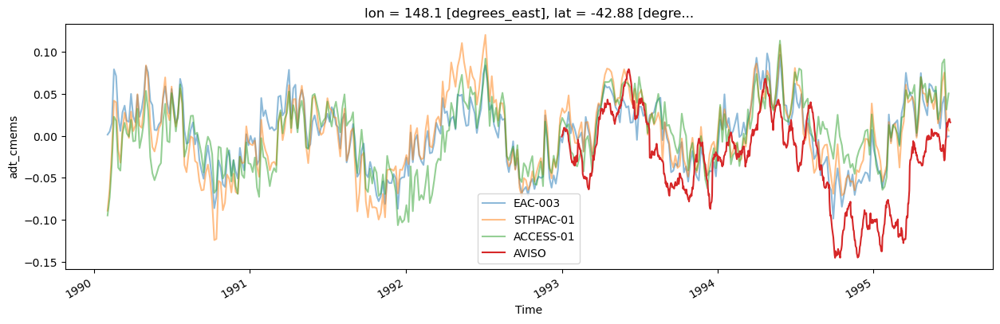

In [25]:
# Plot the regridded/resampled model and obs at specific point
start = '1990-01'
end = '1995-06'
coord = [148, -43]
alpha = [.5, .5, .5, 1.0]
plt.figure(figsize=(15,4))

for i, name in enumerate(['EAC-003','STHPAC-01', 'ACCESS-01', 'AVISO']):
    d_mean_anom[i][1].sel(time=slice(start, end)).sel(lon=coord[0], lat=coord[1],method='nearest').plot(label=name, alpha=alpha[i])
plt.legend()


Some comments on this - What's being shown is 6 months from Jan 1993 to July 1993 of SSH from the model output of EAC-003 and STHPAC-01 as well as observations. The model output has been downsampled (5-day averages) in time, and coarsened in space in an attempt to account for the way the Observational dataset has been pre-processed (See comments above). What we can see here is that for the specific small region chosen, the slow change in observations is represented well in the models, whilst the shorter period fluctuations vary between each time-series. Interstingly, the STHPAC-01 almost looks to be better at representing the AVISO data. 

This plot is more of a sanity check then anything else. Let's now make some spatial maps to show the variance across the region in all three datasets. 

### Spatial Maps

In [43]:
eac_std = d_mean_anom[2][1].std(dim='time', skipna=True)
eac_std

<xarray.DataArray (lat: 129, lon: 79)>
dask.array<_sqrt, shape=(129, 79), dtype=float32, chunksize=(129, 79), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float32 142.4 142.6 142.9 143.1 ... 161.1 161.4 161.6 161.9
  * lat      (lat) float32 -46.12 -45.88 -45.62 -45.38 ... -14.62 -14.38 -14.12

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.04/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


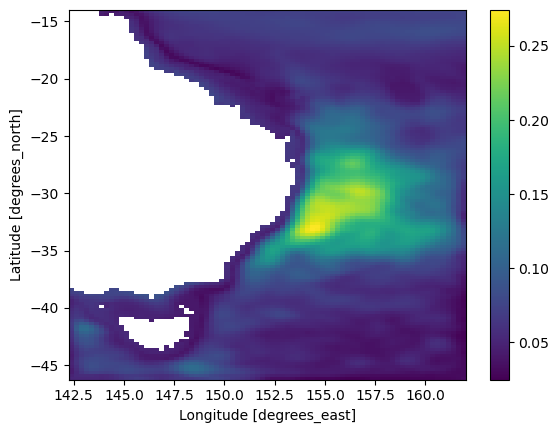

In [44]:
eac_std.plot()

In [45]:
# Select start and end dates over which to compute the standard deviation...
# start = '1990-01'
# end = '1995-06'
# Subset the datasets to the start/end slice and compute standard deviation
stdev_ls = []
for i, name in enumerate(['ACCESS-01','STHPAC-01','EAC-003', 'AVISO']):
    ds = d_mean_anom[i][1]
    stdev_ls.append(ds.std(dim='time', skipna=True))

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.04/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.04/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.04/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


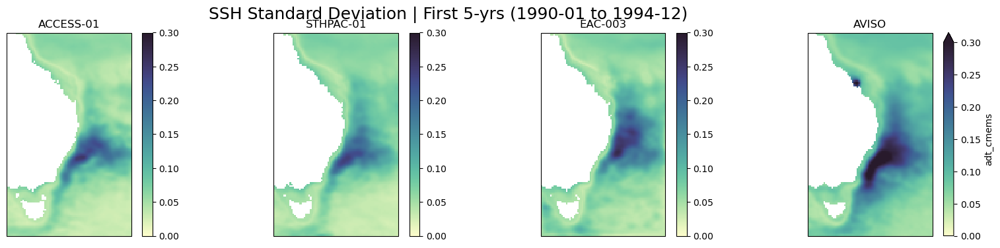

In [46]:
model_names = ['ACCESS-01',  'STHPAC-01','EAC-003', 'AVISO']
projection = ccrs.PlateCarree()
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20,4),
                         subplot_kw={'projection':projection})
max_std=0.3
# stdev SSH plots
for i, ax in enumerate(axes.flatten()):
    p = stdev_ls[i].plot(ax=ax, cmap=cm.cm.deep,
                        vmin=0, vmax=max_std, 
                        add_colorbar=True)
    ax.set_title(model_names[i])
fig.suptitle('SSH Standard Deviation | First 5-yrs (1990-01 to 1994-12)', fontsize=18)

plt.subplots_adjust(hspace=0.8)

Text(0.5, 0.98, 'SSH Standard Deviation | First 5-yrs (1990-01 to 1994-12)')

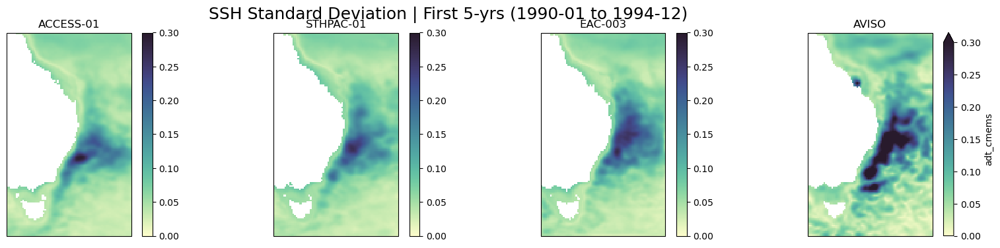

In [81]:
model_names = ['ACCESS-01',  'STHPAC-01','EAC-003', 'AVISO']
projection = ccrs.PlateCarree()
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20,4),
                         subplot_kw={'projection':projection})
max_std=0.3
# stdev SSH plots
for i, ax in enumerate(axes.flatten()):
    p = stdev_ls[i].plot(ax=ax, cmap=cm.cm.deep,
                        vmin=0, vmax=max_std, 
                        add_colorbar=True)
    ax.set_title(model_names[i])
fig.suptitle('SSH Standard Deviation | First 5-yrs (1990-01 to 1994-12)', fontsize=18)

plt.subplots_adjust(hspace=0.8)

Do I want to look at the differences between them? E.g., subtract observations from all models than look at biases?

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.04/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.04/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.04/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.04/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.04/lib/python3.9/site-packages/dask/array/numpy_compat.py:43: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


Text(0.5, 0.98, 'Sea-level Variance Bias | First 5-yrs (1990-01 to 1994-12)')

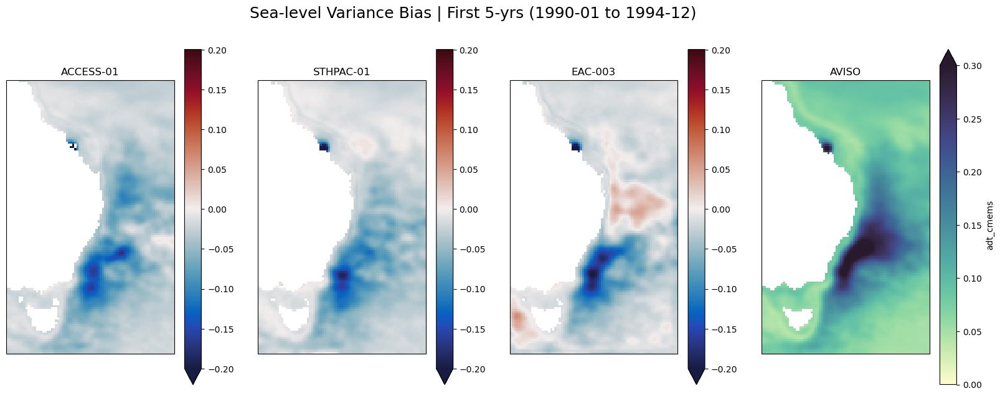

In [47]:
model_names = ['ACCESS-01',  'STHPAC-01','EAC-003', 'AVISO']
projection = ccrs.PlateCarree()
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20,7),
                         subplot_kw={'projection':projection})
max_std=0.3
# stdev SSH plots
for i, ax in enumerate(axes.flatten()):
    if i in range(3):
        diff = stdev_ls[i] - stdev_ls[3]
        p = diff.plot(ax=ax, cmap=cm.cm.balance, 
                      vmin=-0.2, vmax=0.2,
                      add_colorbar=True)
    else:
        p = stdev_ls[i].plot(ax=ax, cmap=cm.cm.deep,
                            vmin=0, vmax=max_std, 
                            add_colorbar=True)
        
    ax.set_title(model_names[i])
fig.suptitle('Sea-level Variance Bias | First 5-yrs (1990-01 to 1994-12)', fontsize=18)

In [87]:
obs_raw.time.min().values

numpy.datetime64('1993-01-01T00:00:00.000000000')

Okay so the above is plotted from the new subset of data which is perhaps why things don't look entirely insightful. Although there is somewhat lighter shading in the EAC-003 relative to the ACCESS-OM2-01, all three show strong weak biases in the extension region. 

Over what period did I take the variance for AVISO? From 1990 to 1995, whereby the AVISO starts from 1993 so taking the standard deviation only over 2 years. Hence, this plot unfortunately does not show us much about the relative improvement of the EAC-003 as we are taking the variance over a very short period of time. 

In [ ]:
%%time
model_ls = [access_daily, sthpac_daily, eac_daily]
mean_ls = []
std_ls = []
for model in model_ls:
    model_mean = model.mean(dim='time').load()
    model_std = model.std(dim='time', skipna=False).load()
    mean_ls.append(model_mean)
    std_ls.append(model_std)
    print(f"finished {str(model.name)}")

finished eta_t
finished zos
finished zos
CPU times: user 6.46 s, sys: 870 ms, total: 7.33 s
Wall time: 43.5 s


In [ ]:
%%time
obs_ssh_mean = obs_ssh.mean(dim='time').load()
obs_ssh_std = obs_ssh.std(dim='time').load()


CPU times: user 1.6 s, sys: 257 ms, total: 1.85 s
Wall time: 13.8 s


/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.01/lib/python3.9/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


In [ ]:
# mean_ls.append(obs_ssh_mean)
std_ls.append(obs_ssh_std)

### Plot & Compare
Plot the time-mean and standard deviation of both of the model outputs and the CMEMS observational dataset.

Text(0.5, 0.98, 'Mean daily SSH: First 5-yrs (1990-01 to 1994-12)')

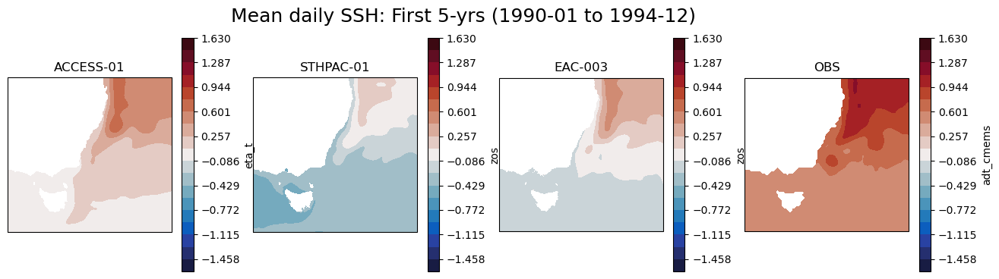

In [20]:
model_names = ['ACCESS-01', 'STHPAC-01', 'EAC-003', 'OBS']
projection = ccrs.PlateCarree()

fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(16,4),
                         subplot_kw={'projection':projection})
max_std=0.3
max_mean=1.63

# mean SSH plots
for i, ax in enumerate(axes.flatten()):
    p = mean_ls[i].plot.contourf(ax=ax, cmap=cm.cm.balance,
                        vmin=-max_mean, vmax=max_mean, 
                        add_colorbar=True, levels=20)
    ax.set_title(model_names[i])
fig.suptitle('Mean daily SSH: First 5-yrs (1990-01 to 1994-12)', fontsize=18)

Okay, so from the global snapshot earlier, we see that the SSH (`eta_t`) in this case is pretty much positive until around 50 degrees South. This is why we are seeing all positive values for SSH in this region, whereas the regional models seem more well-balanced, i.e., positive anomalies in the northern regions, negative anomalies in the southern regions. But the question is **are the ssh anomalies (`zos`) in the regional models taken relative to some reference level *specific* to the domain limits?** If so, we'd expect the **reference levels to be different** and hence why the mean SSH values look quite different between the two. 

A better understanding of SSH for this circumstance is to look at the variance. 

Text(0.5, 0.98, 'SSH Standard Deviation | First 5-yrs (1990-01 to 1994-12)')

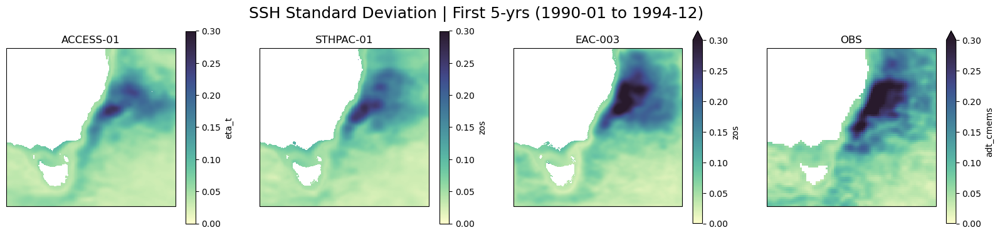

In [27]:
projection = ccrs.PlateCarree()

fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20,4),
                         subplot_kw={'projection':projection})
max_std=0.3
max_mean=1.63

# mean SSH plots
for i, ax in enumerate(axes.flatten()):
    p = std_ls[i].plot(ax=ax, cmap=cm.cm.deep,
                        vmin=0, vmax=max_std, 
                        add_colorbar=True)
    ax.set_title(model_names[i])
fig.suptitle('SSH Standard Deviation | First 5-yrs (1990-01 to 1994-12)', fontsize=18)

# 3. Sea Surface Temperature Comparison with NOAA OISST
The approach here will be quite similar to the above approach for SSH. Load in the SST data, run through the preprocessing and then compare with observations.

In [11]:
om2_sst,_ = open_iaf_global(input_vars=['temp'],
                            first_year=1990, last_year=2020,
                           decode_times=True)
om2_sst

<xarray.Dataset>
Dimensions:         (xt_ocean: 3600, yt_ocean: 2700, st_ocean: 75,
                     st_edges_ocean: 76, time: 10957, nv: 2)
Coordinates:
  * xt_ocean        (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.85 79.95
  * yt_ocean        (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.94 89.98
  * st_ocean        (st_ocean) float64 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * st_edges_ocean  (st_edges_ocean) float64 0.0 1.083 ... 5.61e+03 5.809e+03
  * time            (time) datetime64[ns] 1990-01-01T12:00:00 ... 2019-12-31T...
  * nv              (nv) float64 1.0 2.0
Data variables:
    temp            (time, st_ocean, yt_ocean, xt_ocean) float32 dask.array<chunksize=(31, 75, 300, 300), meta=np.ndarray>
    average_T1      (time) datetime64[ns] dask.array<chunksize=(31,), meta=np.ndarray>
    average_T2      (time) datetime64[ns] dask.array<chunksize=(31,), meta=np.ndarray>
    average_DT      (time) timedelta64[ns] dask.array<chunksize=(31,), meta=np.ndarray>
    time_bnds       (time, nv) timedelta64[ns] dask.array<chunksize=(31, 2), meta=np.ndarray>
Attributes:
    filename:   ocean-3d-temp-1-daily-mean-ym_1990_01.nc
    title:      ACCESS-OM2-01
    grid_type:  mosaic
    grid_tile:  1
    history:    20221019T1326Z: /g/data/ik11/inputs/access-om2/bin/mppnccombi...

In [6]:
eac_path = '/scratch/v45/jr5971/mom6-setonix/eac_iaf_003/'
eac_snapshot = xr.open_dataset(glob.glob(eac_path+'output000/*ocean_daily.nc')[0])
eac_idx = {'W':eac_snapshot.xh.min().values, 'E':eac_snapshot.xh.max().values,
           'S':eac_snapshot.yh.min().values, 'N':eac_snapshot.yh.max().values}
eac_idx

{'W': array(-217.78333333),
 'E': array(-198.01666667),
 'S': array(-46.17862959),
 'N': array(-14.07299099)}

In [12]:
# Subset OM2
om2_sst_eacsub = om2_sst['temp'].sel(xt_ocean=slice(eac_idx['W'], eac_idx['E']),
                             yt_ocean=slice(eac_idx['S'], eac_idx['N'])).sel(
                            st_ocean=0, method='nearest')
om2_sst_eacsub

<xarray.DataArray 'temp' (time: 10957, yt_ocean: 380, xt_ocean: 198)>
dask.array<getitem, shape=(10957, 380, 198), dtype=float32, chunksize=(31, 203, 198), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -217.7 -217.6 -217.5 ... -198.2 -198.1 -198.0
  * yt_ocean  (yt_ocean) float64 -46.16 -46.09 -46.02 ... -14.3 -14.2 -14.11
    st_ocean  float64 0.5413
  * time      (time) datetime64[ns] 1990-01-01T12:00:00 ... 2019-12-31T12:00:00
Attributes:
    long_name:      Conservative temperature
    units:          K
    valid_range:    [-10. 500.]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    coordinates:    geolon_t geolat_t
    standard_name:  sea_water_conservative_temperature

In [ ]:
%%time
om2_sst_eacsub.to_netcdf('/g/data/v45/jr5971/mhw-analysis/mhws_om2/sst_om2_eac.nc')

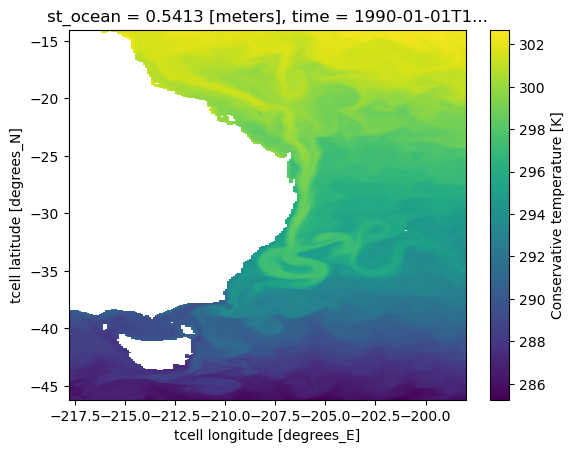

In [13]:
om2_sst_eacsub.isel(time=0).plot()

In [9]:
len(sthpac_files)

347

In [7]:
# import daily data from regional models;
# eac_files = glob.glob(eac_003+'output*/*daily.nc')
# eac_daily = xr.open_mfdataset(eac_files)
sthpac_files = glob.glob(sthpac_01+ 'output*/*daily.nc')
sthpac_files.sort()
sthpac_daily = xr.open_mfdataset(sthpac_files[300:], chunks={'time':-1})
# print(f'date range for eac; {eac_daily.time.min().values} - {eac_daily.time.max().values}')

In [32]:
sthpac_daily['tos'].time.max().values

array(cftime.DatetimeJulian(2015, 1, 31, 12, 0, 0, 0, has_year_zero=False),
      dtype=object)

In [ ]:
sthpac_daily_2 = xr.open_mfdataset(sthpac_files[200:-2])

In [33]:
print(f'date range for sthpac; {sthpac_daily.time.min().values} - {sthpac_daily.time.max().values}')

date range for sthpac; 2006-10-01 12:00:00 - 2015-01-31 12:00:00


In [34]:
sthpac_sst_eacsub = sthpac_daily['tos'].sel(xh=slice(eac_idx['W'], eac_idx['E']),
                                            yh=slice(eac_idx['S'], eac_idx['N']))
sthpac_sst_eacsub

<xarray.DataArray 'tos' (time: 3045, yh: 380, xh: 198)>
dask.array<getitem, shape=(3045, 380, 198), dtype=float32, chunksize=(31, 380, 198), chunktype=numpy.ndarray>
Coordinates:
  * xh       (xh) float64 -217.7 -217.6 -217.5 -217.4 ... -198.2 -198.1 -198.0
  * yh       (yh) float64 -46.16 -46.09 -46.02 -45.95 ... -14.3 -14.2 -14.11
  * time     (time) object 2006-10-01 12:00:00 ... 2015-01-31 12:00:00
Attributes:
    units:          degC
    long_name:      Sea Surface Temperature
    cell_methods:   area:mean yh:mean xh:mean time: mean
    cell_measures:  area: areacello
    time_avg_info:  average_T1,average_T2,average_DT
    standard_name:  sea_surface_temperature

In [23]:
from tqdm import tqdm

In [36]:
from dask.diagnostics import ProgressBar


In [37]:
write_job = sthpac_sst_eacsub.to_netcdf('/g/data/v45/jr5971/mhw-analysis/mhws_sthpac/sst_sthpac_eac_chunk2.nc', compute=False)
with ProgressBar():
    print(f"Writing to {'/g/data/v45/jr5971/mhw-analysis/mhws_sthpac/sst_sthpac_eac_chunk2.nc'}")
    write_job.compute()

Writing to /g/data/v45/jr5971/mhw-analysis/mhws_sthpac/sst_sthpac_eac_chunk2.nc


In [24]:
with tqdm(total=100, desc="saving netCDF", unit="%", position=0) as pbar:
    sthpac_sst_eacsub.to_netcdf('/g/data/v45/jr5971/mhw-analysis/mhws_sthpac/sst_sthpac_eac.nc')
    # Update progress bar
    pbar.update(100)

saving netCDF: 100%|██████████| 100/100 [00:58<00:00,  1.72%/s]


Right, so we've loaded in all the data. We can see that the smallest date range is from 1990 to the end of 1994 (5 years in total). Let's set this as our date range.

Next we need to subset spatial extent down to the smallest spatial extent which is the SRM (EAC-003) in this case. Let's get the coordinate limits of this and subset the PARENT and LRM models.

**I don't want to subset in time so I'm commenting all that out**

In [9]:
# dates = eac_daily
# date_range = [str(dates.time.min().values), str(dates.time.max().values)]
# subset PARENT AND EAC in time;
access_daily = om2_sst.isel(st_ocean=0)['temp']-273.15
sthpac_daily = sthpac_daily['tos']
eac_daily = eac_daily['tos']

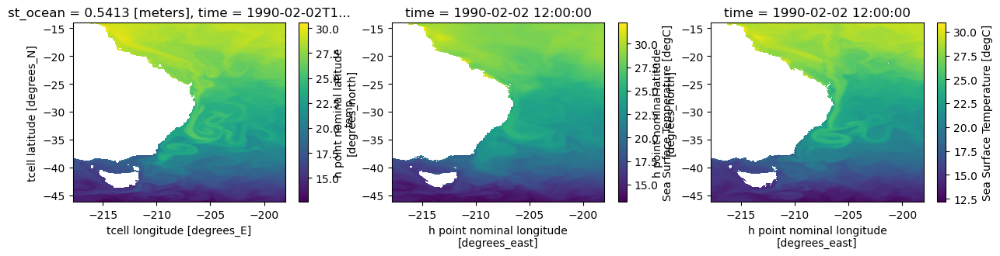

In [132]:
plt.figure(figsize=(15,3))
plt.subplot(1,3,1)
access_daily.isel(time=0).plot()
plt.subplot(1,3,2)
sthpac_daily.isel(time=0).plot()
plt.subplot(1,3,3)
eac_daily.isel(time=0).plot()

In [10]:
# spatial extent;
yextent = [eac_daily.yh.min().values, eac_daily.yh.max().values]
xextent = [eac_daily.xh.min().values, eac_daily.xh.max().values]
# subset PARENT AND LRM
access_daily = access_daily.sel(xt_ocean = slice(xextent[0], xextent[1]), 
                           yt_ocean = slice(yextent[0], yextent[1]))
sthpac_daily = sthpac_daily.sel(xh=slice(xextent[0], xextent[1]),
                                yh=slice(yextent[0], yextent[1]))
# rename lat/lon coords
access_daily = access_daily.rename({'xt_ocean':'lon', 'yt_ocean':'lat'})
sthpac_daily = sthpac_daily.rename({'xh':'lon', 'yh':'lat'})
eac_daily = eac_daily.rename({'xh':'lon', 'yh':'lat'})

print(f'sthpac new dims are: {sthpac_daily.dims}')
print(f'access new dims are: {access_daily.dims}')

sthpac new dims are: ('time', 'lat', 'lon')
access new dims are: ('time', 'lat', 'lon')


#### Import NOAA data

In [11]:
noaa_path = '/g/data/ia39/aus-ref-clim-data-nci/oisst/data/yearly/*.nc'
file_list = glob.glob(noaa_path)

In [13]:
file_list.sort()
newlist = []
i=0
while '1990' not in file_list[i]:
    i+=1
first=i
newlist = file_list[first:]
newlist[:]

['/g/data/ia39/aus-ref-clim-data-nci/oisst/data/yearly/oisst-avhrr-v02r01_1990.nc',
 '/g/data/ia39/aus-ref-clim-data-nci/oisst/data/yearly/oisst-avhrr-v02r01_1991.nc',
 '/g/data/ia39/aus-ref-clim-data-nci/oisst/data/yearly/oisst-avhrr-v02r01_1992.nc',
 '/g/data/ia39/aus-ref-clim-data-nci/oisst/data/yearly/oisst-avhrr-v02r01_1993.nc',
 '/g/data/ia39/aus-ref-clim-data-nci/oisst/data/yearly/oisst-avhrr-v02r01_1994.nc',
 '/g/data/ia39/aus-ref-clim-data-nci/oisst/data/yearly/oisst-avhrr-v02r01_1995.nc',
 '/g/data/ia39/aus-ref-clim-data-nci/oisst/data/yearly/oisst-avhrr-v02r01_1996.nc',
 '/g/data/ia39/aus-ref-clim-data-nci/oisst/data/yearly/oisst-avhrr-v02r01_1997.nc',
 '/g/data/ia39/aus-ref-clim-data-nci/oisst/data/yearly/oisst-avhrr-v02r01_1998.nc',
 '/g/data/ia39/aus-ref-clim-data-nci/oisst/data/yearly/oisst-avhrr-v02r01_1999.nc',
 '/g/data/ia39/aus-ref-clim-data-nci/oisst/data/yearly/oisst-avhrr-v02r01_2000.nc',
 '/g/data/ia39/aus-ref-clim-data-nci/oisst/data/yearly/oisst-avhrr-v02r01_20

In [14]:
oisst = xr.open_mfdataset(newlist)
oisst = oisst.sel(lat = slice(yextent[0], yextent[1]), 
                  lon = slice(xextent[0]+360, xextent[1]+360))
oisst = oisst['sst']
oisst['lon'] = oisst.lon - 360
oisst

<xarray.DataArray 'sst' (time: 12317, zlev: 1, lat: 129, lon: 79)>
dask.array<getitem, shape=(12317, 1, 129, 79), dtype=float32, chunksize=(366, 1, 129, 79), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 -46.12 -45.88 -45.62 -45.38 ... -14.62 -14.38 -14.12
  * lon      (lon) float32 -217.6 -217.4 -217.1 -216.9 ... -198.6 -198.4 -198.1
  * time     (time) datetime64[ns] 1990-01-01T12:00:00 ... 2023-09-22T12:00:00
  * zlev     (zlev) float32 0.0
Attributes:
    long_name:  Daily sea surface temperature
    units:      Celsius

### Regrid all model output to OISST grid

In [15]:
# input grid - eac-003
## rename coords for regridding
eac_raw = eac_daily#.rename({'yh':'lat','xh':'lon'})
sthpac_raw = sthpac_daily#.rename({'yh':'lat','xh':'lon'})
access_raw = access_daily#.rename({'yt_ocean':'lat','xt_ocean':'lon'})
## chunk access to avoid errors
access_raw = access_raw.chunk({'time':500, 'lat':-1,'lon':-1})

# output grid - obs_ssh
obs_raw = oisst.squeeze()

datetimeindex_eac = eac_daily.indexes['time'].to_datetimeindex()
eac_raw['time'] = ('time',datetimeindex_eac)
datetimeindex_sthpac = sthpac_daily.indexes['time'].to_datetimeindex()
sthpac_raw['time'] = ('time',datetimeindex_sthpac)
# access_raw['time'] = ('time',datetimeindex)

# regrid eac and sthpac to obs
regridder_eac = xesmf.Regridder(eac_raw, obs_raw, method='bilinear')
regridder_sthpac = xesmf.Regridder(sthpac_raw, obs_raw, method='bilinear')
regridder_access = xesmf.Regridder(access_raw, obs_raw, method='bilinear')

# regrid datasets;
eac_regridded = regridder_eac(eac_raw)
sthpac_regridded = regridder_sthpac(sthpac_raw)
access_regridded = regridder_access(access_raw)

In [16]:
%%time
# Let's firstly subtract the means away from each dataset in order to normalise them...
d_mean_anom = []
for d in [access_regridded, sthpac_regridded, eac_regridded, obs_raw]:
    d_mean = d.mean('time').compute()
    d_anom = (d - d_mean).compute()
    d_mean_anom.append((d_mean, d_anom))

CPU times: user 38.8 s, sys: 13.6 s, total: 52.4 s
Wall time: 5min 40s


Right, so in the NOAA dataset, we have both the anomaly and the raw sst. It looks like the anomalies are calculated from the long-term monthly mean climatology from 1991 to 2020. Now, there's a few ways we could do this - 
1. Calculate the monthly climatology for the model output then take anomalies.
2. Just take a single mean and take anomalies from that. This isn't the most scienfically robust way of doing things due to the seasonally variability dominating the overall anomaly but let's just try this first...

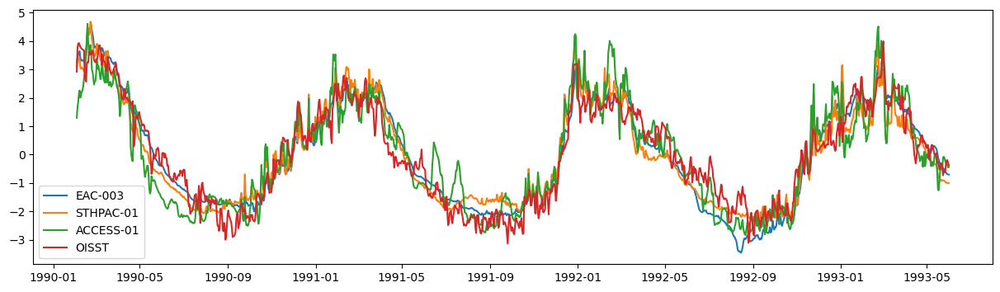

In [137]:
# Select time over which to slice all data
start = '1990-01'
end = '1995-06'
coord = [148, -43]
alpha = [.5, .5, .5, 1.0]
plt.figure(figsize=(15,4))

for i, name in enumerate(['EAC-003','STHPAC-01', 'ACCESS-01', 'OISST']):
    da = d_mean_anom[i][1].sel(time=slice(start, end)).sel(lon=coord[0], lat=coord[1],method='nearest')
    try:
        dates = da.indexes['time'].to_datetimeindex()
    except:
        dates = da['time']
    plt.plot(dates, da.data, label = name)
    
plt.legend()

Some comments on this - What's being shown is 6 months from Jan 1993 to July 1993 of SSH from the model output of EAC-003 and STHPAC-01 as well as observations. The model output has been downsampled (5-day averages) in time, and coarsened in space in an attempt to account for the way the Observational dataset has been pre-processed (See comments above). What we can see here is that for the specific small region chosen, the slow change in observations is represented well in the models, whilst the shorter period fluctuations vary between each time-series. Interstingly, the STHPAC-01 almost looks to be better at representing the AVISO data. 

This plot is more of a sanity check then anything else. Let's now make some spatial maps to show the variance across the region in all three datasets. 

### Spatial Maps

In [17]:
%%time
# Calculate standard deviation
# start = '1990-01'
# end = '1995-06'
stdev_ls = []
for i, name in enumerate(['ACCESS-01','STHPAC-01','EAC-003', 'OISST']):
    ds = d_mean_anom[i][1]
    stdev_ls.append(ds.std(dim='time', skipna=False).compute())
    

CPU times: user 605 ms, sys: 299 ms, total: 904 ms
Wall time: 810 ms


Text(0.5, 0.98, 'SST Standard Deviation | First 5-yrs (1990-01 to 1994-12)')

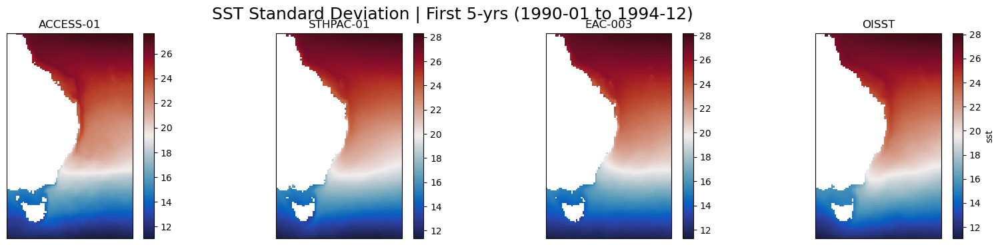

In [18]:
### PLOT MEAN BIAS
model_names = ['ACCESS-01',  'STHPAC-01','EAC-003', 'OISST']
projection = ccrs.PlateCarree()
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20,4),
                         subplot_kw={'projection':projection})
# Mean SSH plots
for i, ax in enumerate(axes.flatten()):
    p = d_mean_anom[i][0].plot(ax=ax, cmap=cm.cm.balance, 
                  add_colorbar=True)


    ax.set_title(model_names[i])
fig.suptitle('SST Standard Deviation | First 5-yrs (1990-01 to 1994-12)', fontsize=18)

In [34]:
help(plt.subplots_adjust)

Help on function subplots_adjust in module matplotlib.pyplot:

subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
    Adjust the subplot layout parameters.
    
    Unset parameters are left unmodified; initial values are given by
    :rc:`figure.subplot.[name]`.
    
    Parameters
    ----------
    left : float, optional
        The position of the left edge of the subplots,
        as a fraction of the figure width.
    right : float, optional
        The position of the right edge of the subplots,
        as a fraction of the figure width.
    bottom : float, optional
        The position of the bottom edge of the subplots,
        as a fraction of the figure height.
    top : float, optional
        The position of the top edge of the subplots,
        as a fraction of the figure height.
    wspace : float, optional
        The width of the padding between subplots,
        as a fraction of the average Axes width.
    hspace : float, optional


In [ ]:
### PLOT MEAN BIAS
model_names = ['ACCESS-01',  'STHPAC-01','EAC-003', 'OISST']
projection = ccrs.PlateCarree()
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(17,4),
                         subplot_kw={'projection':projection})
# Mean SSH plots
for i, ax in enumerate(axes.flatten()):
    if i in range(3):
        diff = d_mean_anom[i][0] - d_mean_anom[3][0]
        p = diff.plot(ax=ax, cmap=cm.cm.balance, 
                      vmin=-1.5, vmax=1.5,
                      add_colorbar=True)
    else:
        p = d_mean_anom[i][0].plot(ax=ax, cmap=cm.cm.thermal,
                                   add_colorbar=True)

    ax.set_title(model_names[i])
fig.suptitle('SST Mean Bias | First 5-yrs (1990-01 to 1994-12)', fontsize=18)
fig.subplots_adjust(top=.85)

Text(0.5, 0.98, 'SST Mean Bias | First 5-yrs (1990-01 to 1994-12)')

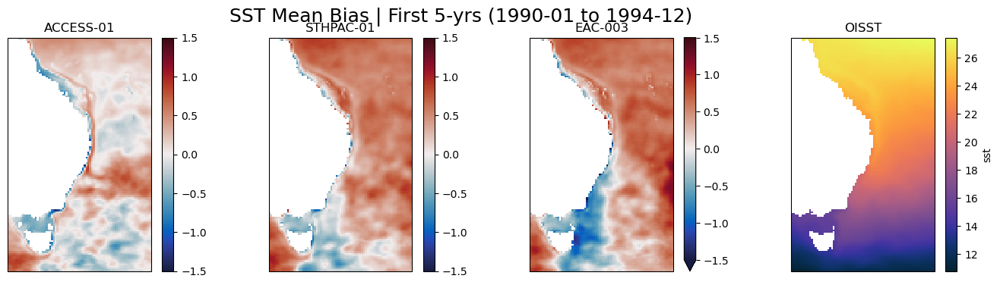

In [165]:
### PLOT MEAN BIAS
model_names = ['ACCESS-01',  'STHPAC-01','EAC-003', 'OISST']
projection = ccrs.PlateCarree()
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(17,4),
                         subplot_kw={'projection':projection})
# Mean SSH plots
for i, ax in enumerate(axes.flatten()):
    if i in range(3):
        diff = d_mean_anom[i][0] - d_mean_anom[3][0]
        p = diff.plot(ax=ax, cmap=cm.cm.balance, 
                      vmin=-1.5, vmax=1.5,
                      add_colorbar=True)
    else:
        p = d_mean_anom[i][0].plot(ax=ax, cmap=cm.cm.thermal,
                                   add_colorbar=True)

    ax.set_title(model_names[i])
fig.suptitle('SST Mean Bias | First 5-yrs (1990-01 to 1994-12)', fontsize=18)

Okay so this is quite interesting - there are clearly some mean temperature biases between the different models. Again though, unfortunately due to only having a short range of model output, we cannot draw any strong conclusions here. 

In [21]:
import cartopy.feature as cfeature

Text(0.5, 0.98, 'SST Standard Deviation | First 5-yrs (1990-01 to 1994-12)')

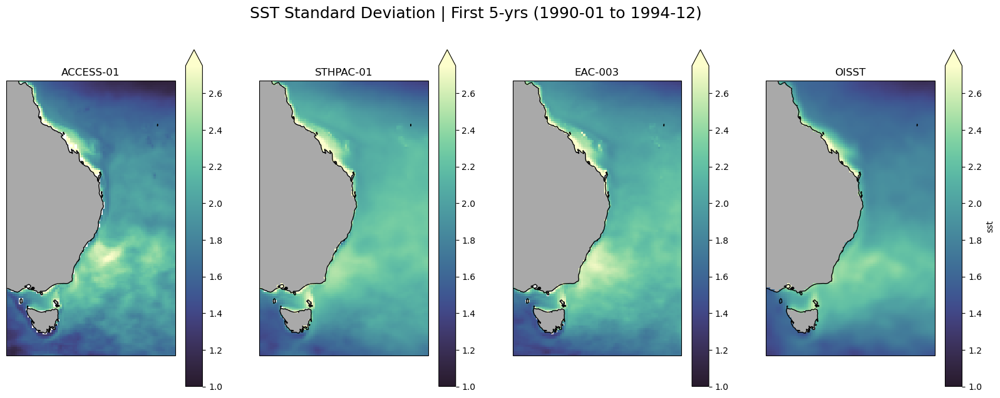

In [22]:
model_names = ['ACCESS-01',  'STHPAC-01','EAC-003', 'OISST']
projection = ccrs.PlateCarree()
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20,7),
                         subplot_kw={'projection':projection})
max_std=2.75
# stdev SSH plots
for i, ax in enumerate(axes.flatten()):
    p = stdev_ls[i].plot(ax=ax, cmap=cm.cm.deep_r,
                        vmin=1, vmax=max_std, 
                        add_colorbar=True)
    ax.set_title(model_names[i])
    ax.add_feature(cfeature.LAND, color='darkgrey')
    ax.coastlines()
fig.suptitle('SST Standard Deviation | First 5-yrs (1990-01 to 1994-12)', fontsize=18)

Text(0.5, 0.98, 'SST Standard Deviation Bias | First 5-yrs (1990-01 to 1994-12)')

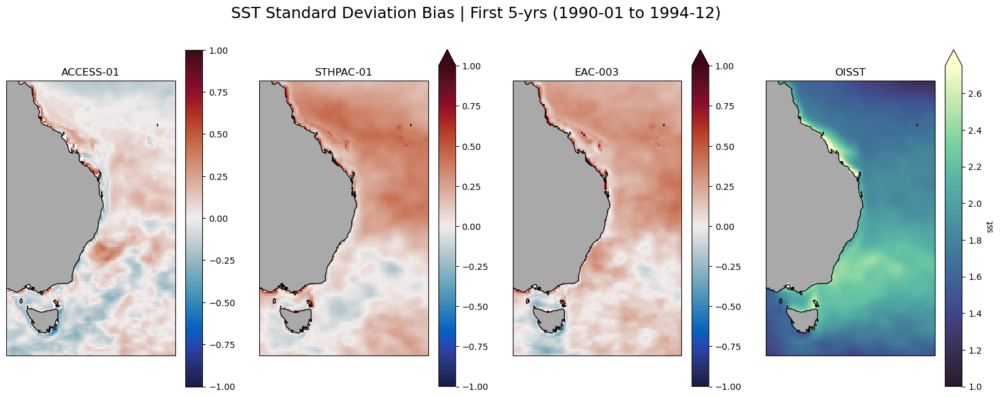

In [23]:
# Identify bias in variance
model_names = ['ACCESS-01',  'STHPAC-01','EAC-003', 'OISST']
projection = ccrs.PlateCarree()
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20,7),
                         subplot_kw={'projection':projection})
max_std=2.75
# stdev SSH plots
for i, ax in enumerate(axes.flatten()):
    if i in range(3):
        diff = stdev_ls[i] - stdev_ls[3]
        p = diff.plot(ax=ax, cmap=cm.cm.balance,
                      vmin=-1, vmax=1,
                      add_colorbar=True)
        
    else:
        p = stdev_ls[i].plot(ax=ax, cmap=cm.cm.deep_r,
                        vmin=1, vmax=max_std, 
                        add_colorbar=True)
    ax.set_title(model_names[i])
    ax.add_feature(cfeature.LAND, color='darkgrey')
    ax.coastlines()
fig.suptitle('SST Standard Deviation Bias | First 5-yrs (1990-01 to 1994-12)', fontsize=18)

Text(0.5, 0.98, 'SST Standard Deviation Bias | First 5-yrs (1990-01 to 1994-12)')

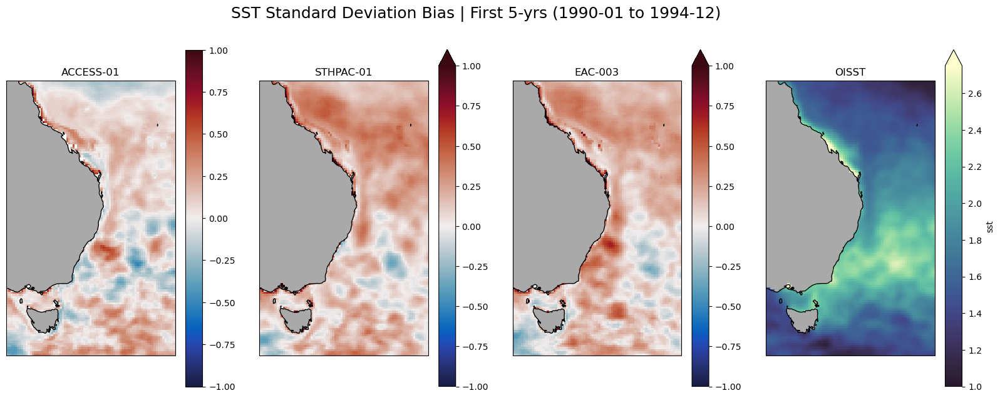

In [166]:
# Identify bias in variance
model_names = ['ACCESS-01',  'STHPAC-01','EAC-003', 'OISST']
projection = ccrs.PlateCarree()
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20,7),
                         subplot_kw={'projection':projection})
max_std=2.75
# stdev SSH plots
for i, ax in enumerate(axes.flatten()):
    if i in range(3):
        diff = stdev_ls[i] - stdev_ls[3]
        p = diff.plot(ax=ax, cmap=cm.cm.balance,
                      vmin=-1, vmax=1,
                      add_colorbar=True)
        
    else:
        p = stdev_ls[i].plot(ax=ax, cmap=cm.cm.deep_r,
                        vmin=1, vmax=max_std, 
                        add_colorbar=True)
    ax.set_title(model_names[i])
    ax.add_feature(cfeature.LAND, color='darkgrey')
    ax.coastlines()
fig.suptitle('SST Standard Deviation Bias | First 5-yrs (1990-01 to 1994-12)', fontsize=18)

Alrighty, so we have this surface data. T